<a href="https://colab.research.google.com/github/dequiroz/1MTR53_RobIA/blob/main/TransformacionesMatematicas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src="https://drive.google.com/uc?export=view&id=1FsTa2YzWwxY-HBkd2EOXAlkPJ1zpikWv" alt="drawing" width="150"/>


<p align="center">
<img src="https://drive.google.com/uc?export=view&id=1VBn7nKlruxCPLHH_UuD8B2pkvKP7JLRd" alt="drawing" width="800"/>


</br>

<img src="https://drive.google.com/uc?export=view&id=1tpg1CJh4or-VMrY-Qip25hgedgwy1Y8-" alt="drawing" width="800"/>
</p>


#Transformaciones Matemáticas
* Diego Quiroz Velasquez
* Pontificia Universidad Católica del Perú
* Sección Ingeniería Mecatrónica

---
Este archivo presenta el uso de transformaciones de rotación y transformaciones homogeneas para simular y graficar el movimiento de un vehículo movil que se desplaza en una trayectoria circular

<img src="https://drive.google.com/uc?export=view&id=1vgFoFHEKMN0WcAFlKS2hPMg2KuBm3sp9" alt="drawing"/>



Se tiene un vehículo movil cuyas velocidades están mostradas en la siguiente Figura

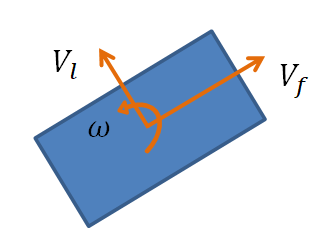

donde:
* $V_F$ representa la velocidad de avance del robot
* $V_l$ representa la velocidad de movimiento lateral
* $\omega$ representa la velocidad de giro del robot

Debido a la configuraciones de las ruedas del robot, este no puede moverse de forma lateral por lo que $V_l = 0$.

Se puede demostrar que, si el vehiculo se desplaza con $V_l$ y $\omega$ constantes, este debería moverse mediante una trayectoria circular como se muestra a continuación


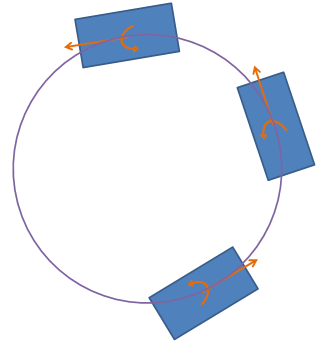

En esta Figura se puede apreciar que mientras el robot se desplaza, su velocidad lineal cambia de dirección, siendo esta tangente a la trayectoria circular.

#Codigo base

El siguiente código contiene lo mínimo necesario para realizar la simulación. Se recomienda leerlo y revisarlo para entenderlo.
Contiene las siguientes secciones principales:


* Se importan las librerias empleadas, principalmente numpy para el manejo de arreglos y operaciones matriciales, y matplotlib para las funciones gráficas
* Se setean las variables iniciales dimensionales del robot movil
* Se define y configura los graficos a mostrar (el vehículo y su trayectoria)
* función update. Se ejecuta en cada iteración de la simulación mediante FuncAnimation



In [15]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc

dt = 0.1
# Variables de estado del vehículo
x, y, theta = 0, 0, 0
# Dimensiones vehículo
L, W = 1.0, 0.5

# Trayectorias para graficar
veh_traj_x, veh_traj_y = [], []  # Trayectoria del vehículo
# Configuración de la figura
fig, ax = plt.subplots(figsize=(8, 6))
plt.close()
ax.set_xlim(-5, 5)
ax.set_ylim(-5, 5)
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_title("Simulación de Robot Movil")
# Dibujar elementos
vehicle_line, = ax.plot([], [], 'k-', lw=2)  # Vehículo
veh_trace, = ax.plot([], [], 'g-', lw=1)  # Trayectoria del vehículo

def reset_animation():
  global x, y, theta, vehicle_line, veh_trace, veh_traj_x, veh_traj_y
  x, y, theta = 0, 0, 0
  # Dibujar elementos
  vehicle_line.set_data([], [])
  veh_trace.set_data([], [])
  veh_traj_x, veh_traj_y = [], []  # Trayectoria del vehículo
  return(veh_trace, vehicle_line)

def update(frame):
    global x, y, theta
    # Velocidad del vehículo
    v = 1
    omega = 0.5

    corners_vehicle = np.array([[-L/2, L/2, L/2, -L/2, -L/2],
                               [-W/2, -W/2, W/2, W/2, -W/2]])
    vehicle_corners_x = corners_vehicle[0]
    vehicle_corners_y = corners_vehicle[1]

    # Actualizar trayectoria
    veh_traj_x.append(x)
    veh_traj_y.append(y)
    # Actualizar gráficos
    veh_trace.set_data(veh_traj_x, veh_traj_y)
    vehicle_line.set_data(vehicle_corners_x, vehicle_corners_y)
    return(veh_trace, vehicle_line)

# Animación
ani = animation.FuncAnimation(fig, update, init_func=reset_animation, frames=100, interval=30, blit=True, repeat=True)
# Nota: la siguiente parte es necesaria para ejecutar el código en colab
rc('animation', html='jshtml')
ani

#Ploteo de trayectoria de robot

Se sabe que el robot movil está avanzando con una velocidad lineal constante y velocidad de rotación constante.  Esto implica que el robot movil debe moverse en una trayectoria circular.

Como se pudo observar previamente, se puede apreciar que mientras el robot se desplaza su velocidad lineal cambia de dirección. Esto implica que el robot presenta un desplazamiento en el eje $x$ y un desplazamiento en el eje $y$ que dependen de la orientación del robot ($\theta$), tal como se muestra a continuación

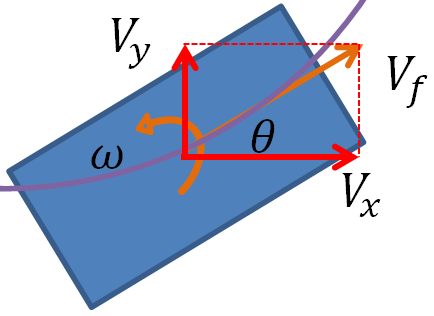

Estas velocidades $V_x$ y $V_y$ pueden calcularse mediante la proyección de $V_f$ según el ángulo de inclinación del vehículo $\theta$, tal que

\begin{equation}
V_x = V_f * cos(\theta)
\end{equation}
\begin{equation}
V_y = V_f * sin(\theta)
\end{equation}

Sin embargo, también se puede apreciar que las velocidades del robot $V_f$ y $V_l$ forman un sistema de referencia ortogonal. Por lo que las velocidades cartesianas podrian obtenerse mediante una rotación de las velocidades del robot tal que

\begin{equation}
\begin{bmatrix}
    V_x \\
    V_y
\end{bmatrix} =
R *
\begin{bmatrix}
    V_f \\
    V_l
\end{bmatrix}
\end{equation}

donde $R$ es la matriz de rotación dada por

\begin{bmatrix}
    cos(\theta) & -sin(\theta)\\
    sin(\theta) & cos(\theta)
\end{bmatrix}

Para realizar este procedimiento en python, se procede a definir una función que obtenga la matriz de rotación para un ángulo $\theta$ dado

In [2]:
def rotacion_z(theta):
    '''
    Calcula la matriz de rotación en Z para un plano 2D

    Parámetros (float):
        theta: ángulo de rotación en el eje Z (con signo)

    Retorna (float):
        Matriz de rotación en 2D
    '''
    R = np.array([[np.cos(theta), -np.sin(theta)],
                  [np.sin(theta), np.cos(theta)]])
    return R

Lo cual permite emplear la función de la siguiente manera

In [3]:
v = 1 #Velocidad de avance de robot (V_l en la explicación previa)

R = rotacion_z(theta=0) #matriz de rotación cuando el robot está horizontal
v_x, v_y = R @ np.array([v, 0])  # El simbolo @ implica producto matricial empleando numpy
print('\nInclinación del robot: 0°')
print(f'{v_x = :.2f}')
print(f'{v_y = :.2f}')

R = rotacion_z(theta=np.deg2rad(45)) #matriz de rotación cuando el robot está horizontal
v_x, v_y = R @ np.array([v, 0])  # El simbolo @ implica producto matricial empleando numpy
print('\nInclinación del robot: 45°')
print(f'{v_x = :.2f}')
print(f'{v_y = :.2f}')

print('\nInclinación del robot: 90°')
R = rotacion_z(theta=np.deg2rad(90)) #matriz de rotación cuando el robot está horizontal
v_x, v_y = R @ np.array([v, 0])  # El simbolo @ implica producto matricial empleando numpy
print(f'{v_x = :.2f}')
print(f'{v_y = :.2f}')

print('\nInclinación del robot: 180°')
R = rotacion_z(theta=np.deg2rad(180)) #matriz de rotación cuando el robot está horizontal
v_x, v_y = R @ np.array([v, 0])  # El simbolo @ implica producto matricial empleando numpy
print(f'{v_x = :.2f}')
print(f'{v_y = :.2f}')



Inclinación del robot: 0°
v_x = 1.00
v_y = 0.00

Inclinación del robot: 45°
v_x = 0.71
v_y = 0.71

Inclinación del robot: 90°
v_x = 0.00
v_y = 1.00

Inclinación del robot: 180°
v_x = -1.00
v_y = 0.00


Con los valores de la velocidades cartesianas $v_x$ y $v_y$ se puede calcular la posición del vehículo en todo momento integrando las velocidades

$x_k = x_{k-1} + v_x * dt$

$y_k = y_{k-1} + v_y * dt$

$\theta_k = \theta_{k-1} + \omega * dt$

Estas funciones junto con la aplicacion de la función de rotación se pueden encapsular en la siguiente función

In [4]:
def actualizar_pose_vehiculo(x, y, theta, v=0, omega=0):
    '''
    Actualiza la posición de un vehiculo considerando que este se desplaza
    con velocidades de avance y rotación constantes

    Parámetros (float):
        x: posición x actual del vehículo
        y: posición y actual del vehículo
        theta: orientación actual del vehículo

    Retorna (float):
        x: posición x actualizada del vehículo
        y: posición y actualizada del vehículo
        theta: orientación actualizada del vehículo
    '''
    # Rotar velocidades de robot
    R = rotacion_z(theta)
    v_x, v_y = R @ np.array([v, 0])

    # Integrar velocidades
    x += v_x * dt
    y += v_y * dt
    theta += omega * dt

    return x, y, theta

Con Esta función podemos actualizar la función update para mostrar en la simulación la trayectoria que realiza el robot movil

In [19]:
def update(frame):
    global x, y, theta, veh_trace, vehicle_line
    # Velocidad del vehículo
    v = 1
    omega = 0.5

    x, y, theta = actualizar_pose_vehiculo(x, y, theta, v, omega)
    corners_vehicle = np.array([[-L/2, L/2, L/2, -L/2, -L/2],
                               [-W/2, -W/2, W/2, W/2, -W/2]])
    vehicle_corners_x = corners_vehicle[0]
    vehicle_corners_y = corners_vehicle[1]


    # Actualizar trayectoria
    veh_traj_x.append(x)
    veh_traj_y.append(y)
    # Actualizar gráficos
    veh_trace.set_data(veh_traj_x, veh_traj_y)
    vehicle_line.set_data(vehicle_corners_x, vehicle_corners_y)
    return(veh_trace, vehicle_line)

# Animación
ani = animation.FuncAnimation(fig, update, init_func=reset_animation, frames=100, interval=30, blit=True, repeat=True)
# Nota: la siguiente parte es necesaria para ejecutar el código en colab
rc('animation', html='jshtml')
ani

# Ploteo de movimiento de robot

Con la tracyectoria que realiza el robot movil podemos dibujar y simular el movimiento del mismo. Lo único que debemos hacer es posicionar el robot sobre la trayectoria que se ha definido.

Para hacer eso, primero vamos a desplazar el robot sobre la trayectoria.  Esto implica mover cada esquina del robot la misma distancia que el centro del robot.  Para ello, vamos a definir una función calcular_grafico_vehiculo() que nos permitirá encapsular estos pasos

In [20]:
def calcular_grafico_vehiculo(theta=0, x=0, y=0):
    '''
    Devuelve las coordenadas vehicle_x y vehicle_y del contorno del vehículo.

    Parámetros (float):
        x: posición x actual del vehículo
        y: posición y actual del vehículo
        theta: orientación actual del vehículo

    Retorna (float):
        vehicle_x: arreglo con coordenadas x de las esquinas del vehículo para graficar
        vehicle_y: arreglo con ccoordenadas y de las esquinas del vehículo para graficar
    '''
    # Coordenadas del vehículo para graficar un rectangulo.
    # Se deben transformar según la orientación y posición actual del vehículo.
    corners_vehicle = np.array([[-L/2, L/2, L/2, -L/2, -L/2],
                               [-W/2, -W/2, W/2, W/2, -W/2]])

    corners_vehicle_x = corners_vehicle[0] + x
    corners_vehicle_y = corners_vehicle[1] + y

    return corners_vehicle_x, corners_vehicle_y

Y actualizamos la función update para que use esta nueva function

In [22]:
def update(frame):
    global x, y, theta
    # Velocidad del vehículo
    v = 1
    omega = 0.5

    x, y, theta = actualizar_pose_vehiculo(x, y, theta, v, omega)
    vehicle_corners_x, vehicle_corners_y = calcular_grafico_vehiculo(theta, x, y)

    # Actualizar trayectoria
    veh_traj_x.append(x)
    veh_traj_y.append(y)
    # Actualizar gráficos
    veh_trace.set_data(veh_traj_x, veh_traj_y)
    vehicle_line.set_data(vehicle_corners_x, vehicle_corners_y)
    return(veh_trace, vehicle_line)

ani = animation.FuncAnimation(fig, update, init_func=reset_animation, frames=100, interval=30, blit=True, repeat=True)
# Nota: la siguiente parte es necesaria para ejecutar el código en colab
rc('animation', html='jshtml')
ani

Podemos notar en la simulación, que el vehiculo se mueve junto con la trayectoria, sin embargo no rota.  Para corregir esto, se requiere aplicar una transformación de rotación, por lo que modificamos la función `calcular_grafico_vehiculo`

In [25]:
def calcular_grafico_vehiculo(theta=0, x=0, y=0):
    '''
    Devuelve las coordenadas vehicle_x y vehicle_y del contorno del vehículo.

    Parámetros (float):
        x: posición x actual del vehículo
        y: posición y actual del vehículo
        theta: orientación actual del vehículo

    Retorna (float):
        vehicle_x: arreglo con coordenadas x de las esquinas del vehículo para graficar
        vehicle_y: arreglo con ccoordenadas y de las esquinas del vehículo para graficar
    '''
    # Coordenadas del vehículo para graficar un rectangulo.
    # Se deben transformar según la orientación y posición actual del vehículo.
    corners_vehicle = np.array([[-L/2, L/2, L/2, -L/2, -L/2],
                               [-W/2, -W/2, W/2, W/2, -W/2]])

    R = rotacion_z(theta)
    corners_vehicle = R @ corners_vehicle

    corners_vehicle_x = corners_vehicle[0] + x
    corners_vehicle_y = corners_vehicle[1] + y

    return corners_vehicle_x, corners_vehicle_y


ani = animation.FuncAnimation(fig, update, init_func=reset_animation, frames=100, interval=30, blit=True, repeat=True)
# Nota: la siguiente parte es necesaria para ejecutar el código en colab
rc('animation', html='jshtml')
ani

##Resolución con matrices homogeneas

Se puede apreciar que aplicando una transformación de rotación seguido por una traslación se obtiene la simulación deseada para el vehículo.

A continuación se muestra el procedimiento para realizar transformaciones homogeneas para realizar ambos procesos.

In [26]:
def matriz_homogenea_2D(theta=0, dx=0, dy=0):
    '''
    Calcula la matriz homogenea para una transformación 2D

    Parámetros (float):
        theta: ángulo de rotación en el eje Z (con signo)
        dx: desplazamiento en el eje x
        dy: desplazamiento en el eje y

    Retorna (float):
        Matriz homogenea para una transformación 3D
    '''
    H = np.eye(3)
    H[0:2,0:2] = rotacion_z(theta)
    H[0:2,0:2] = rotacion_z(theta)
    H[0:2,2] = [dx,dy]
    return H

In [27]:
def calcular_grafico_vehiculo(theta=0, x=0, y=0):
    '''
    Devuelve las coordenadas vehicle_x y vehicle_y del contorno del vehículo.

    Parámetros (float):
        x: posición x actual del vehículo
        y: posición y actual del vehículo
        theta: orientación actual del vehículo

    Retorna (float):
        vehicle_x: arreglo con coordenadas x de las esquinas del vehículo para graficar
        vehicle_y: arreglo con ccoordenadas y de las esquinas del vehículo para graficar
    '''
    # Coordenadas del vehículo para graficar un rectangulo.
    # Se deben transformar según la orientación y posición actual del vehículo.
    corners_vehicle = np.array([[-L/2, L/2, L/2, -L/2, -L/2],
                               [-W/2, -W/2, W/2, W/2, -W/2]])

    # Metodo: Matriz homogenea
    matriz_robot = matriz_homogenea_2D(theta, x, y)
    P1 = matriz_robot @ matriz_homogenea_2D(0, -L/2, -W/2)
    P2 = matriz_robot @ matriz_homogenea_2D(0,  L/2, -W/2)
    P3 = matriz_robot @ matriz_homogenea_2D(0,  L/2,  W/2)
    P4 = matriz_robot @ matriz_homogenea_2D(0, -L/2,  W/2)
    corners_vehicle_x = [P1[0,2],P2[0,2],P3[0,2],P4[0,2],P1[0,2]]
    corners_vehicle_y = [P1[1,2],P2[1,2],P3[1,2],P4[1,2],P1[1,2]]

    return corners_vehicle_x, corners_vehicle_y

In [28]:
ani = animation.FuncAnimation(fig, update, init_func=reset_animation, frames=100, interval=30, blit=True, repeat=True)
# Nota: la siguiente parte es necesaria para ejecutar el código en colab
rc('animation', html='jshtml')
ani